In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from scipy.stats import chi2_contingency

In [3]:
from scipy.stats import mannwhitneyu
from scipy.stats import ttest_ind


In [4]:
import plotly.io as pio
import plotly.graph_objects as go
pio.renderers.default = 'iframe'
pio.templates.default="simple_white"


In [5]:
df=pd.read_csv("BankChurners_edited.csv")


In [6]:
df.head(5)

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [7]:
df.shape

(10127, 20)

In [8]:
df[df.Attrition_Flag=="Attrited Customer"].shape

(1627, 20)

In [9]:
df.Income_Category.replace(['$60K - $80K', 'Less than $40K', '$80K - $120K', '$40K - $60K',
       '$120K +', 'Unknown'],['60K_80K', 'Less_than_40K', '80K_120K', '40K_60K',
       '120K_+', 'Unknown'],inplace=True)

In [10]:
df.Attrition_Flag.replace(["Existing Customer","Attrited Customer"],["Existing","Attrited"],inplace=True)

In [11]:
df.columns

Index(['Attrition_Flag', 'Customer_Age', 'Gender', 'Dependent_count',
       'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category',
       'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

# Pandas Profiling 

In [12]:
from pandas_profiling import ProfileReport

C:\Users\hp\AppData\Local\Temp\ipykernel_15936\2274191625.py:1: DeprecationWarning:

`import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.



In [13]:
profile=ProfileReport(df)

In [14]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Univariate Analysis 

## 0 Customer Attrition

**Conclusion**
- The target variable has 83.9% Existing Customer lable and 16.1% Attrition label which indicatews that the dataset is imbalanced
- No missing values

In [15]:
temp_df=df.Attrition_Flag.value_counts().reset_index()
temp_df

,index,Attrition_Flag
0,Existing,8500
1,Attrited,1627


In [16]:
fig=px.pie(temp_df,values="Attrition_Flag",names="index")
fig.update_layout(title={#'text': 'Attrition Flag',
                         'x': 0.45,  # Set the x position to center the title
                         'xanchor': 'center'  # Anchor the title to the center of the plot
                        },
                  margin=dict(l=10, r=10, t=80, b=25),
                  width=300,
                  height=300,
                  #title_font_size=24
                 )
fig.write_image("Attrition.png")
fig.update_traces(textfont_size=14)
fig.show()

In [17]:
df.Attrition_Flag.isnull().sum()

0

## 1 Customer Age

**Conclusions**
- Since mean and median is approximately equal and skewness is close to 0, we can say that customer age approximately follows normal distribution.
- no missing values

In [18]:
fig=px.histogram(df,x="Customer_Age",title="Customer Age Histogram")
fig.show(renderer='iframe')

In [19]:
df.Customer_Age.describe()

count    10127.000000
mean        46.325960
std          8.016814
min         26.000000
25%         41.000000
50%         46.000000
75%         52.000000
max         73.000000
Name: Customer_Age, dtype: float64

In [20]:
df.Customer_Age.skew()

-0.033605016317173456

In [21]:
df.Customer_Age.isnull().sum()

0

## 2 Gender

**Conclusions**
- In the dataset, we have 52.9% female customers and 47.1% male customers
- No missing vlaues

In [22]:
temp_df=df.Gender.value_counts().reset_index()
temp_df

,index,Gender
0,F,5358
1,M,4769


In [23]:
fig=px.pie(temp_df,values="Gender",names="index")
fig.update_layout(title={#'text': 'Pie Chart of Gender',
                         'x': 0.45,  # Set the x position to center the title
                         'xanchor': 'center'  # Anchor the title to the center of the plot
                        },
                  margin=dict(l=10, r=10, t=50, b=25),
                  width=300,
                  height=300,
                  #title_font_size=28
                 )

fig.write_image("Gender.png")
fig.show()

## 3 Dependent Count

**Conclusions**
-

In [24]:
df.Dependent_count.isnull().sum()

0

In [25]:
temp_df=df.Dependent_count.value_counts().reset_index()
temp_df

,index,Dependent_count
0,3,2732
1,2,2655
2,1,1838
3,4,1574
4,0,904
5,5,424


In [26]:
fig=px.bar(temp_df,x=temp_df['index'],y=temp_df.Dependent_count,text_auto=True, labels={"index":'No of Dependent Count',
                                                                                       'Dependent_count':'Counts'})
fig.show(renderer='iframe')

In [27]:
px.pie(temp_df,values="Dependent_count",names='index')

In [28]:
df.Dependent_count.describe()

count    10127.000000
mean         2.346203
std          1.298908
min          0.000000
25%          1.000000
50%          2.000000
75%          3.000000
max          5.000000
Name: Dependent_count, dtype: float64

In [29]:
df.Dependent_count.plot(kind="kde")

<Axes: ylabel='Density'>

In [30]:
import matplotlib
matplotlib.use('Qt5Agg')

In [31]:
sns.kdeplot(df,x=df.Dependent_count)
plt.show()

## 4 Education Level 

In [160]:
df.columns[4]

'Education_Level'

In [161]:
df.Education_Level.isnull().sum()

0

In [216]:
temp_df=df.Education_Level.value_counts().reset_index()
temp_df

,index,Education_Level
0,Graduate,3128
1,High School,2013
2,Unknown,1519
3,Uneducated,1487
4,College,1013
5,Post-Graduate,516
6,Doctorate,451


In [217]:
fig=px.bar(temp_df,x=temp_df['index'],y=temp_df['Education_Level'],text_auto=True,labels={"index":'Education _Level',
                                                                                          'Education_Level':'Count'})

In [222]:
fig=px.pie(temp_df,values="Education_Level",names="index",hover_name="index")
fig.update_layout(margin=dict(l=10, r=10, t=70, b=25),
                  width=400,
                  height=300
)
fig.update_traces(textfont_size=14)
fig.show()
fig.write_image("Education Level.png")

## 5 Merital Status

In [189]:
df.columns[5]

'Marital_Status'

In [224]:
temp_df=df.Marital_Status.value_counts().reset_index()
temp_df.columns=['Marital_Status','Count']
temp_df

,Marital_Status,Count
0,Married,4687
1,Single,3943
2,Unknown,749
3,Divorced,748


In [228]:
fig=px.pie(temp_df,values="Count",names="Marital_Status")

fig.update_layout(margin=dict(l=10, r=10, t=80, b=25),
                  width=300,
                  height=300
)
fig.update_traces(textfont_size=14)
fig.show()
fig.write_image("Marital Status.png")


## 6 Income Category


In [192]:
df.columns[6]

'Income_Category'

In [232]:
temp_df=df.Income_Category.value_counts().reset_index()
temp_df.columns=['Income_Category','Count']
temp_df

,Income_Category,Count
0,Less_than_40K,3561
1,40K_60K,1790
2,80K_120K,1535
3,60K_80K,1402
4,Unknown,1112
5,120K_+,727


In [233]:
fig=px.pie(temp_df,values="Count",names='Income_Category',hover_name="Income_Category")

fig.update_layout(margin=dict(l=10, r=10, t=50, b=25),
                  width=400,
                  height=300
)
fig.update_traces(textfont_size=14)
fig.show()
fig.write_image("Income Category.png")

## 

In [196]:
df.columns[7]

'Card_Category'

In [235]:
temp_df=df.Card_Category.value_counts().reset_index()
temp_df.columns=['Card_Category','Count']
temp_df

,Card_Category,Count
0,Blue,9436
1,Silver,555
2,Gold,116
3,Platinum,20


In [236]:
fig=px.pie(temp_df,values="Count",names='Card_Category',hover_name="Card_Category")
fig.update_layout(margin=dict(l=10, r=10, t=50, b=25),
                  width=300,
                  height=300
)
fig.update_traces(textfont_size=14)
fig.show()
fig.write_image("Card Category.png")

## 8 Months  on books

In [211]:
df.columns[8] 

'Months_on_book'

In [212]:
px.histogram(df,x="Months_on_book")

In [213]:
df.Months_on_book.describe()

count    10127.000000
mean        35.928409
std          7.986416
min         13.000000
25%         31.000000
50%         36.000000
75%         40.000000
max         56.000000
Name: Months_on_book, dtype: float64

In [214]:
px.box(df.Months_on_book)

## 9 Total Relationship Count
- Total no. of products held by the customer

In [216]:
temp_df=df.Total_Relationship_Count.value_counts().reset_index()
temp_df.columns=['Total_Relationship_Count','Counts']
temp_df

,Total_Relationship_Count,Counts
0,3,2305
1,4,1912
2,5,1891
3,6,1866
4,2,1243
5,1,910


In [217]:
px.pie(temp_df,values="Counts",names="Total_Relationship_Count")

In [218]:
px.bar(temp_df,y="Counts",x="Total_Relationship_Count")

## 10 Months Inactive
No. of months inactive in the last 12 months

In [219]:
df.columns[10]

'Months_Inactive_12_mon'

<Axes: ylabel='Density'>

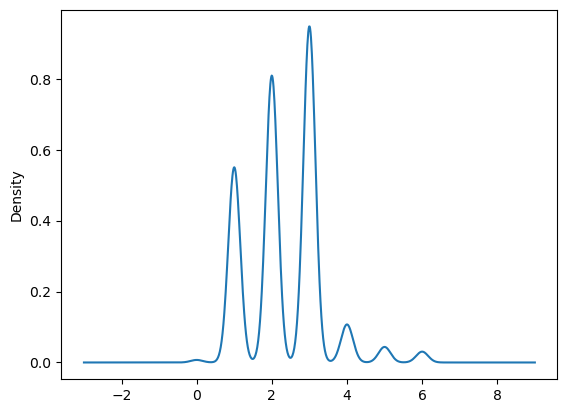

In [220]:
df['Months_Inactive_12_mon'].plot(kind="kde")

In [221]:
px.histogram(df.Months_Inactive_12_mon)

## 11 Contacts_Count_12_mon
No. of Contacts between the customer and bank in the last 12 months

In [222]:
df.columns[11]

'Contacts_Count_12_mon'

In [55]:
temp_df=df.Contacts_Count_12_mon.value_counts().reset_index()
temp_df.columns=["Contacts_Count_12_mon",'Count']
temp_df

,Contacts_Count_12_mon,Count
0,3,3380
1,2,3227
2,1,1499
3,4,1392
4,0,399
5,5,176
6,6,54


In [56]:
px.bar(temp_df,x="Contacts_Count_12_mon",y="Count",text_auto=True)

# Bivariate Analysis

## Attrition and Age

In [399]:
df[df["Attrition_Flag"]=="Existing"]["Customer_Age"].describe().round(2)

count    8500.00
mean       46.26
std         8.08
min        26.00
25%        41.00
50%        46.00
75%        52.00
max        73.00
Name: Customer_Age, dtype: float64

In [400]:
df[df["Attrition_Flag"]=="Attrited"]["Customer_Age"].describe().round(2)

count    1627.00
mean       46.66
std         7.67
min        26.00
25%        41.00
50%        47.00
75%        52.00
max        68.00
Name: Customer_Age, dtype: float64

In [280]:
fig=px.box(df,
       x="Attrition_Flag",
       y="Customer_Age",
       color="Attrition_Flag",
       template='simple_white',
       labels={"Customer_Age":"Customer Age","Attrition_Flag":"Attrition Flag"}
      )

In [284]:
fig.update_layout(
                  margin=dict(l=10, r=10, t=50, b=25),
                  width=350,
                  height=350,
                  title_font_size=28,
                  xaxis=dict(
                     title_font=dict(size=15),  # Change the size of the x-axis label
                     tickfont=dict(size=15),    # Change the size of the x-axis tick labels
                 ),
                  yaxis=dict(
                      title_font=dict(size=15),  # Change the size of the y-axis label
                      tickfont=dict(size=15),
                 ))
fig.show()
fig.write_image("Customer Age and Attrition.png")

In [312]:
attrited_age = df[df['Attrition_Flag'] == 'Attrited']['Customer_Age']
existing_age = df[df['Attrition_Flag'] == 'Existing']['Customer_Age']

# Perform the Mann-Whitney U test
statistic, p_value = mannwhitneyu(attrited_age, existing_age)

# Print the test results
print("Mann-Whitney U test statistic:", statistic)
print("Mann-Whitney U test p-value:", p_value)

Mann-Whitney U test statistic: 7104960.5
Mann-Whitney U test p-value: 0.07809994878128952


## Target and Dependent Count

In [287]:
df[df["Attrition_Flag"]=="Attrited"]["Dependent_count"].describe().round(2)

count    1627.00
mean        2.40
std         1.28
min         0.00
25%         2.00
50%         2.00
75%         3.00
max         5.00
Name: Dependent_count, dtype: float64

In [288]:
df[df["Attrition_Flag"]=="Existing"]["Dependent_count"].describe().round(2)

count    8500.00
mean        2.34
std         1.30
min         0.00
25%         1.00
50%         2.00
75%         3.00
max         5.00
Name: Dependent_count, dtype: float64

In [294]:
fig=px.box(df,
       x="Attrition_Flag",
       y="Dependent_count",
       color="Attrition_Flag",
       labels={"Dependent_count":"No of Dependent Persons","Attrition_Flag":"Attrition Flag"},
       template='simple_white'
      )

In [295]:
fig.update_layout(
                  margin=dict(l=10, r=10, t=50, b=25),
                  width=350,
                  height=350,
                  title_font_size=28,
                  xaxis=dict(
                     title_font=dict(size=15),  # Change the size of the x-axis label
                     tickfont=dict(size=15),    # Change the size of the x-axis tick labels
                 ),
                  yaxis=dict(
                      title_font=dict(size=15),  # Change the size of the y-axis label
                      tickfont=dict(size=15),
                 )
                 )
fig.show()
fig.write_image("Dependent Count and Attrition.png")

In [27]:
temp_df=pd.crosstab(index=df.Dependent_count,columns=df.Attrition_Flag)
temp_df

Attrition_Flag,Attrited,Existing
Dependent_count,,
0,135,769
1,269,1569
2,417,2238
3,482,2250
4,260,1314
5,64,360


In [28]:
chi2, p_value, dof, expected = chi2_contingency(temp_df)
print("Chi-square statistic:", chi2)
print("P-value:", p_value)
print("Degrees of freedom:", dof)

Chi-square statistic: 9.476429774498301
P-value: 0.09150463456682643
Degrees of freedom: 5


In [296]:
attrited_age = df[df['Attrition_Flag'] == 'Attrited']['Dependent_count']
existing_age = df[df['Attrition_Flag'] == 'Existing']['Dependent_count']

# Perform the Mann-Whitney U test
statistic, p_value = mannwhitneyu(attrited_age, existing_age)

# Print the test results
print("Mann-Whitney U test statistic:", statistic)
print("Mann-Whitney U test p-value:", p_value)

Mann-Whitney U test statistic: 7137310.0
Mann-Whitney U test p-value: 0.03472885782137149


## Target and Months on book

In [297]:
df[df["Attrition_Flag"]=="Attrited"]["Months_on_book"].describe().round(2)

count    1627.00
mean       36.18
std         7.80
min        13.00
25%        32.00
50%        36.00
75%        40.00
max        56.00
Name: Months_on_book, dtype: float64

In [298]:
df[df["Attrition_Flag"]=="Existing"]["Months_on_book"].describe().round(2)

count    8500.00
mean       35.88
std         8.02
min        13.00
25%        31.00
50%        36.00
75%        40.00
max        56.00
Name: Months_on_book, dtype: float64

In [302]:
fig=px.box(df,x="Attrition_Flag",
       y="Months_on_book",
       color="Attrition_Flag",
       hover_name="Attrition_Flag",
       labels={"Months_on_book":"Months on Book","Attrition_Flag":"Attrition Flag"}
      )

In [303]:
fig.update_layout(
                  margin=dict(l=10, r=10, t=50, b=25),
                  width=350,
                  height=350,
                  title_font_size=28,
                  xaxis=dict(
                     title_font=dict(size=15),  # Change the size of the x-axis label
                     tickfont=dict(size=15),    # Change the size of the x-axis tick labels
                 ),
                  yaxis=dict(
                      title_font=dict(size=15),  # Change the size of the y-axis label
                      tickfont=dict(size=15),
                 )
                 )
fig.show()
fig.write_image("Months on book and Attrition.png")

In [301]:
attrited_age = df[df['Attrition_Flag'] == 'Attrited']['Months_on_book']
existing_age = df[df['Attrition_Flag'] == 'Existing']['Months_on_book']

# Perform the Mann-Whitney U test
statistic, p_value = mannwhitneyu(attrited_age, existing_age)

# Print the test results
print("Mann-Whitney U test statistic:", statistic)
print("Mann-Whitney U test p-value:", p_value)

Mann-Whitney U test statistic: 7079837.5
Mann-Whitney U test p-value: 0.12366716741255608


## target and Total relationship count

In [304]:
df[df["Attrition_Flag"]=="Attrited"]["Total_Relationship_Count"].describe().round(2)

count    1627.00
mean        3.28
std         1.58
min         1.00
25%         2.00
50%         3.00
75%         5.00
max         6.00
Name: Total_Relationship_Count, dtype: float64

In [306]:
df[df["Attrition_Flag"]=="Existing"]["Total_Relationship_Count"].describe().round(2)

count    8500.00
mean        3.91
std         1.53
min         1.00
25%         3.00
50%         4.00
75%         5.00
max         6.00
Name: Total_Relationship_Count, dtype: float64

In [307]:
fig=px.box(df,x="Attrition_Flag",
       y="Total_Relationship_Count",
       color="Attrition_Flag",
       hover_name="Attrition_Flag",
       labels={"Total_Relationship_Count":"Total Relationship Count","Attrition_Flag":"Attrition Flag"},
      )

In [311]:
fig.update_layout(
                  margin=dict(l=10, r=10, t=50, b=25),
                  width=350,
                  height=350,
                  title_font_size=26,
                  xaxis=dict(
                     title_font=dict(size=15),  # Change the size of the x-axis label
                     tickfont=dict(size=15),    # Change the size of the x-axis tick labels
                 ),
                  yaxis=dict(
                      title_font=dict(size=15),  # Change the size of the y-axis label
                      tickfont=dict(size=15),
                 )
                 )
fig.show()
fig.write_image("Total Relationship Count and Attrition.png")

In [30]:
temp_df=pd.crosstab(index=df.Total_Relationship_Count,columns=df.Attrition_Flag)
temp_df

Attrition_Flag,Attrited,Existing
Total_Relationship_Count,,
1,233,677
2,346,897
3,400,1905
4,225,1687
5,227,1664
6,196,1670


In [31]:
chi2, p_value, dof, expected = chi2_contingency(temp_df)
print("Chi-square statistic:", chi2)
print("P-value:", p_value)
print("Degrees of freedom:", dof)

Chi-square statistic: 284.0675122272908
P-value: 2.6610499913717976e-59
Degrees of freedom: 5


## target and Months inactive 12 months

In [345]:
df[df["Attrition_Flag"]=="Existing"]["Months_Inactive_12_mon"].describe().round(2)

count    8500.00
mean        2.27
std         1.02
min         0.00
25%         1.00
50%         2.00
75%         3.00
max         6.00
Name: Months_Inactive_12_mon, dtype: float64

In [346]:
df[df["Attrition_Flag"]=="Attrited"]["Months_Inactive_12_mon"].describe().round(2)

count    1627.00
mean        2.69
std         0.90
min         0.00
25%         2.00
50%         3.00
75%         3.00
max         6.00
Name: Months_Inactive_12_mon, dtype: float64

In [315]:
fig=px.box(df,x="Attrition_Flag",
       y="Months_Inactive_12_mon",
       color="Attrition_Flag",
       hover_name="Attrition_Flag",
       labels={"Months_Inactive_12_mon":"Months Inactive","Attrition_Flag":"Attrition Flag"}
      )

In [316]:
fig.update_layout(
                  margin=dict(l=10, r=10, t=50, b=25),
                  width=350,
                  height=350,
                  title_font_size=28,
                  xaxis=dict(
                     title_font=dict(size=15),  # Change the size of the x-axis label
                     tickfont=dict(size=15),    # Change the size of the x-axis tick labels
                 ),
                  yaxis=dict(
                      title_font=dict(size=15),  # Change the size of the y-axis label
                      tickfont=dict(size=15),
                 )
                 )
fig.show()
fig.write_image("Months inactive 12 months and Attrition.png")

In [347]:
attrited_age = df[df['Attrition_Flag'] == 'Attrited']['Months_Inactive_12_mon']
existing_age = df[df['Attrition_Flag'] == 'Existing']['Months_Inactive_12_mon']

# Perform the Mann-Whitney U test
statistic, p_value = mannwhitneyu(attrited_age, existing_age)

# Print the test results
print("Mann-Whitney U test statistic:", statistic)
print("Mann-Whitney U test p-value:", p_value)

Mann-Whitney U test statistic: 8687418.0
Mann-Whitney U test p-value: 5.4231160241902516e-67


## Target and contacts count 12 months

In [348]:
df[df["Attrition_Flag"]=="Existing"]["Contacts_Count_12_mon"].describe().round(2)

count    8500.00
mean        2.36
std         1.08
min         0.00
25%         2.00
50%         2.00
75%         3.00
max         5.00
Name: Contacts_Count_12_mon, dtype: float64

In [349]:
df[df["Attrition_Flag"]=="Attrited"]["Contacts_Count_12_mon"].describe().round(2)

count    1627.00
mean        2.97
std         1.09
min         0.00
25%         2.00
50%         3.00
75%         4.00
max         6.00
Name: Contacts_Count_12_mon, dtype: float64

In [322]:
fig=px.box(df,x="Attrition_Flag",
       y="Contacts_Count_12_mon",
       color="Attrition_Flag",
       hover_name="Attrition_Flag",
       labels={"Contacts_Count_12_mon":"Contact Count","Attrition_Flag":"Attrition Flag"}
      )

In [323]:
fig.update_layout(
                  margin=dict(l=10, r=10, t=50, b=25),
                  width=350,
                  height=350,
                  title_font_size=28,
                  xaxis=dict(
                     title_font=dict(size=15),  # Change the size of the x-axis label
                     tickfont=dict(size=15),    # Change the size of the x-axis tick labels
                 ),
                  yaxis=dict(
                      title_font=dict(size=15),  # Change the size of the y-axis label
                      tickfont=dict(size=15),
                 )
                 )
fig.show()
fig.write_image("contacts count 12 months and Attrition.png")

In [321]:
attrited_age = df[df['Attrition_Flag'] == 'Attrited']['Contacts_Count_12_mon']
existing_age = df[df['Attrition_Flag'] == 'Existing']['Contacts_Count_12_mon']

# Perform the Mann-Whitney U test
statistic, p_value = mannwhitneyu(attrited_age, existing_age)

# Print the test results
print("Mann-Whitney U test statistic:", statistic)
print("Mann-Whitney U test p-value:", p_value)

Mann-Whitney U test statistic: 8890849.5
Mann-Whitney U test p-value: 1.1108884976394835e-80


## target and credit limit

In [331]:
df[df["Attrition_Flag"]=="Attrited"]["Credit_Limit"].describe().round(2)

count     1627.00
mean      8136.04
std       9095.33
min       1438.30
25%       2114.00
50%       4178.00
75%       9933.50
max      34516.00
Name: Credit_Limit, dtype: float64

In [332]:
df[df["Attrition_Flag"]=="Existing"]["Credit_Limit"].describe().round(2)

count     8500.00
mean      8726.88
std       9084.97
min       1438.30
25%       2602.00
50%       4643.50
75%      11252.75
max      34516.00
Name: Credit_Limit, dtype: float64

In [89]:
fig=px.box(df,x="Attrition_Flag",
       y="Credit_Limit",
       color="Attrition_Flag",
       hover_name="Attrition_Flag",
       labels={"Credit_Limit":"Credit limit","Attrition_Flag":"Attrition Flag"},
      )

In [90]:
fig.update_layout(
                  margin=dict(l=10, r=10, t=50, b=25),
                  width=350,
                  height=350,
                  title_font_size=28,
                  xaxis=dict(
                     title_font=dict(size=15),  # Change the size of the x-axis label
                     tickfont=dict(size=15),    # Change the size of the x-axis tick labels
                 ),
                  yaxis=dict(
                      title_font=dict(size=15),  # Change the size of the y-axis label
                      tickfont=dict(size=15),
                 )
                 )
fig.show()
fig.write_image("Credit Limit and Attrition.png")

In [337]:
attrited_age = df[df['Attrition_Flag'] == 'Attrited']['Credit_Limit']
existing_age = df[df['Attrition_Flag'] == 'Existing']['Credit_Limit']

# Perform the Mann-Whitney U test
statistic, p_value = mannwhitneyu(attrited_age, existing_age)

# Print the test results
print("Mann-Whitney U test statistic:", statistic)
print("Mann-Whitney U test p-value:", p_value)

Mann-Whitney U test statistic: 6361348.0
Mann-Whitney U test p-value: 3.0078405911217964e-07


## total revolving balance

In [354]:
df[df["Attrition_Flag"]=="Existing"]["Total_Revolving_Bal"].describe().round(2)

count    8500.00
mean     1256.60
std       757.75
min         0.00
25%       800.00
50%      1364.00
75%      1807.00
max      2517.00
Name: Total_Revolving_Bal, dtype: float64

In [353]:
df[df["Attrition_Flag"]=="Attrited"]["Total_Revolving_Bal"].describe().round(2)

count    1627.00
mean      672.82
std       921.39
min         0.00
25%         0.00
50%         0.00
75%      1303.50
max      2517.00
Name: Total_Revolving_Bal, dtype: float64

In [341]:
fig=px.box(df,x="Attrition_Flag",
       y="Total_Revolving_Bal",
       color="Attrition_Flag",
       hover_name="Attrition_Flag",
       labels={"Total_Revolving_Bal":"Total Revolving Balance","Attrition_Flag":"Attrition Flag"},
       #title="Box Plot of Total Revolving Balance (in thousands of dollar) and Customer Attrition",
       #points='all'
      )

In [342]:
fig.update_layout(
                  margin=dict(l=10, r=10, t=50, b=25),
                  width=350,
                  height=350,
                  title_font_size=27,
                  xaxis=dict(
                     title_font=dict(size=15),  # Change the size of the x-axis label
                     tickfont=dict(size=15),    # Change the size of the x-axis tick labels
                 ),
                  yaxis=dict(
                      title_font=dict(size=15),  # Change the size of the y-axis label
                      tickfont=dict(size=15),
                 )
                 )
fig.show()
fig.write_image("Total Revolving Balance and Attrition.png")

In [343]:
attrited_age = df[df['Attrition_Flag'] == 'Attrited']['Total_Revolving_Bal']
existing_age = df[df['Attrition_Flag'] == 'Existing']['Total_Revolving_Bal']

# Perform the Mann-Whitney U test
statistic, p_value = mannwhitneyu(attrited_age, existing_age)

# Print the test results
print("Mann-Whitney U test statistic:", statistic)
print("Mann-Whitney U test p-value:", p_value)

Mann-Whitney U test statistic: 4318784.0
Mann-Whitney U test p-value: 1.9156786730316762e-129


## Average Open to buy

In [359]:
df[df["Attrition_Flag"]=="Existing"]["Avg_Open_To_Buy"].describe().round(2)

count     8500.00
mean      7470.27
std       9087.67
min         15.00
25%       1184.50
50%       3469.50
75%       9978.25
max      34516.00
Name: Avg_Open_To_Buy, dtype: float64

In [360]:
df[df["Attrition_Flag"]=="Attrited"]["Avg_Open_To_Buy"].describe().round(2)

count     1627.00
mean      7463.22
std       9109.21
min          3.00
25%       1587.00
50%       3488.00
75%       9257.50
max      34516.00
Name: Avg_Open_To_Buy, dtype: float64

In [361]:
fig=px.box(df,x="Attrition_Flag",
       y="Avg_Open_To_Buy",
       color="Attrition_Flag",
       hover_name="Attrition_Flag",
       labels={"Avg_Open_To_Buy":"Average Open To Buy","Attrition_Flag":"Attrition Flag"},
       #title="Box Plot of Average Open To Buy (in thousands of dollars)and Customer Attrition"
      )

In [362]:
fig.update_layout(
                  margin=dict(l=10, r=10, t=50, b=25),
                  width=350,
                  height=350,
                  title_font_size=28,
                  xaxis=dict(
                     title_font=dict(size=15),  # Change the size of the x-axis label
                     tickfont=dict(size=15),    # Change the size of the x-axis tick labels
                 ),
                  yaxis=dict(
                      title_font=dict(size=15),  # Change the size of the y-axis label
                      tickfont=dict(size=15),
                 )
                 )
fig.show()
fig.write_image("Average Open to Buy.png")

In [358]:
attrited_age = df[df['Attrition_Flag'] == 'Attrited']['Avg_Open_To_Buy']
existing_age = df[df['Attrition_Flag'] == 'Existing']['Avg_Open_To_Buy']

# Perform the Mann-Whitney U test
statistic, p_value = mannwhitneyu(attrited_age, existing_age)

# Print the test results
print("Mann-Whitney U test statistic:", statistic)
print("Mann-Whitney U test p-value:", p_value)

Mann-Whitney U test statistic: 7213717.0
Mann-Whitney U test p-value: 0.005652366314054008


## Total Transaction Count

In [364]:
df[df["Attrition_Flag"]=="Existing"]["Total_Trans_Ct"].describe().round(2)

count    8500.00
mean       68.67
std        22.92
min        11.00
25%        54.00
50%        71.00
75%        82.00
max       139.00
Name: Total_Trans_Ct, dtype: float64

In [365]:
df[df["Attrition_Flag"]=="Attrited"]["Total_Trans_Ct"].describe().round(2)

count    1627.00
mean       44.93
std        14.57
min        10.00
25%        37.00
50%        43.00
75%        51.00
max        94.00
Name: Total_Trans_Ct, dtype: float64

In [369]:
fig=px.box(df,x="Attrition_Flag",
       y="Total_Trans_Ct",
       color="Attrition_Flag",
       hover_name="Attrition_Flag",
       labels={"Total_Trans_Ct":"Total Trans Count","Attrition_Flag":"Attrition Flag"},
       #title="Box Plot of Total Transaction Count and Customer Attrition"
      )

In [370]:
fig.update_layout(
                  margin=dict(l=10, r=10, t=50, b=25),
                  width=350,
                  height=350,
                  title_font_size=28,
                  xaxis=dict(
                     title_font=dict(size=15),  # Change the size of the x-axis label
                     tickfont=dict(size=15),    # Change the size of the x-axis tick labels
                 ),
                  yaxis=dict(
                      title_font=dict(size=15),  # Change the size of the y-axis label
                      tickfont=dict(size=15),
                 )
                 )
fig.show()
fig.write_image("Total Transaction Count and attrition.png")

In [371]:
attrited_age = df[df['Attrition_Flag'] == 'Attrited']['Total_Trans_Ct']
existing_age = df[df['Attrition_Flag'] == 'Existing']['Total_Trans_Ct']

# Perform the Mann-Whitney U test
statistic, p_value = mannwhitneyu(attrited_age, existing_age)

# Print the test results
print("Mann-Whitney U test statistic:", statistic)
print("Mann-Whitney U test p-value:", p_value)

Mann-Whitney U test statistic: 2826174.0
Mann-Whitney U test p-value: 0.0


### Total Transaction Amount

In [372]:
df[df["Attrition_Flag"]=="Existing"]["Total_Trans_Amt"].describe().round(2)

count     8500.00
mean      4654.66
std       3512.77
min        816.00
25%       2384.75
50%       4100.00
75%       4781.25
max      18484.00
Name: Total_Trans_Amt, dtype: float64

In [378]:
df[df["Attrition_Flag"]=="Attrited"]["Total_Trans_Amt"].describe().round(2)

count     1627.00
mean      3095.03
std       2308.23
min        510.00
25%       1903.50
50%       2329.00
75%       2772.00
max      10583.00
Name: Total_Trans_Amt, dtype: float64

In [376]:
fig=px.box(df,x="Attrition_Flag",
       y="Total_Trans_Amt",
       color="Attrition_Flag",
       hover_name="Attrition_Flag",
       labels={"Total_Trans_Amt":"Amount","Attrition_Flag":"Attrition Flag"},
       #title="Box Plot of Total Transaction Amount and Customer Attrition"
      )

In [377]:
fig.update_layout(
                  margin=dict(l=10, r=10, t=50, b=25),
                  width=350,
                  height=350,
                  title_font_size=28,
                  xaxis=dict(
                     title_font=dict(size=15),  # Change the size of the x-axis label
                     tickfont=dict(size=15),    # Change the size of the x-axis tick labels
                 ),
                  yaxis=dict(
                      title_font=dict(size=15),  # Change the size of the y-axis label
                      tickfont=dict(size=15),
                 )
                 )
fig.show()
fig.write_image("Total Transaction Amount and attrition.png")

In [374]:
attrited_age = df[df['Attrition_Flag'] == 'Attrited']['Total_Trans_Amt']
existing_age = df[df['Attrition_Flag'] == 'Existing']['Total_Trans_Amt']

# Perform the Mann-Whitney U test
statistic, p_value = mannwhitneyu(attrited_age, existing_age)

# Print the test results
print("Mann-Whitney U test statistic:", statistic)
print("Mann-Whitney U test p-value:", p_value)

Mann-Whitney U test statistic: 4481880.0
Mann-Whitney U test p-value: 2.719009390771486e-112


## Total Count Change Q4-Q1
- Ratio of the total transaction count in 4th quarter and the total transaction count in 1st quarter

In [379]:
df[df["Attrition_Flag"]=="Existing"]["Total_Ct_Chng_Q4_Q1"].describe().round(2)

count    8500.00
mean        0.74
std         0.23
min         0.03
25%         0.62
50%         0.72
75%         0.83
max         3.71
Name: Total_Ct_Chng_Q4_Q1, dtype: float64

In [380]:
df[df["Attrition_Flag"]=="Attrited"]["Total_Ct_Chng_Q4_Q1"].describe().round(2)

count    1627.00
mean        0.55
std         0.23
min         0.00
25%         0.40
50%         0.53
75%         0.69
max         2.50
Name: Total_Ct_Chng_Q4_Q1, dtype: float64

In [382]:
fig=px.box(df,x="Attrition_Flag",
       y="Total_Ct_Chng_Q4_Q1",
       color="Attrition_Flag",
       hover_name="Attrition_Flag",
       labels={"Total_Ct_Chng_Q4_Q1":"Ratio","Attrition_Flag":"Attrition Flag"},
       #title="Ratio of the total transaction count in 4th quarter and the total transaction count in 1st quarter"
      )

In [383]:
fig.update_layout(
                  margin=dict(l=10, r=10, t=50, b=25),
                  width=350,
                  height=350,
                  title_font_size=28,
                  xaxis=dict(
                     title_font=dict(size=15),  # Change the size of the x-axis label
                     tickfont=dict(size=15),    # Change the size of the x-axis tick labels
                 ),
                  yaxis=dict(
                      title_font=dict(size=15),  # Change the size of the y-axis label
                      tickfont=dict(size=15),
                 )
                 )
fig.show()
fig.write_image("Total Count Change Q4-Q1 and attrition.png")

In [381]:
attrited_age = df[df['Attrition_Flag'] == 'Attrited']['Total_Ct_Chng_Q4_Q1']
existing_age = df[df['Attrition_Flag'] == 'Existing']['Total_Ct_Chng_Q4_Q1']

# Perform the Mann-Whitney U test
statistic, p_value = mannwhitneyu(attrited_age, existing_age)

# Print the test results
print("Mann-Whitney U test statistic:", statistic)
print("Mann-Whitney U test p-value:", p_value)

Mann-Whitney U test statistic: 3522217.0
Mann-Whitney U test p-value: 1.908240659213709e-216


## Total amount change from Q4 to Q1
- Ratio of the total transaction amount in 4th quarter and the total transaction amount in 1st quarter

In [384]:
df[df["Attrition_Flag"]=="Existing"]["Total_Amt_Chng_Q4_Q1"].describe().round(2)

count    8500.00
mean        0.77
std         0.22
min         0.26
25%         0.64
50%         0.74
75%         0.86
max         3.40
Name: Total_Amt_Chng_Q4_Q1, dtype: float64

In [385]:
df[df["Attrition_Flag"]=="Attrited"]["Total_Amt_Chng_Q4_Q1"].describe().round(2)

count    1627.00
mean        0.69
std         0.21
min         0.00
25%         0.54
50%         0.70
75%         0.86
max         1.49
Name: Total_Amt_Chng_Q4_Q1, dtype: float64

In [387]:
fig=px.box(df,x="Attrition_Flag",
       y="Total_Amt_Chng_Q4_Q1",
       color="Attrition_Flag",
       hover_name="Attrition_Flag",
       labels={"Total_Amt_Chng_Q4_Q1":"Ratio","Attrition_Flag":"Attrition Flag"},
       #title="Ratio of the total Amount change in 4th quarter and the total transaction count in 1st quarter",
      )

In [388]:
fig.update_layout(
                  margin=dict(l=10, r=10, t=50, b=25),
                  width=350,
                  height=350,
                  title_font_size=28,
                  xaxis=dict(
                     title_font=dict(size=15),  # Change the size of the x-axis label
                     tickfont=dict(size=15),    # Change the size of the x-axis tick labels
                 ),
                  yaxis=dict(
                      title_font=dict(size=15),  # Change the size of the y-axis label
                      tickfont=dict(size=15),
                 )
                 )
fig.show()
fig.write_image("Total Amount Change Q4-Q1 and attrition.png")

In [386]:
attrited_age = df[df['Attrition_Flag'] == 'Attrited']['Total_Amt_Chng_Q4_Q1']
existing_age = df[df['Attrition_Flag'] == 'Existing']['Total_Amt_Chng_Q4_Q1']

# Perform the Mann-Whitney U test
statistic, p_value = mannwhitneyu(attrited_age, existing_age)

# Print the test results
print("Mann-Whitney U test statistic:", statistic)
print("Mann-Whitney U test p-value:", p_value)

Mann-Whitney U test statistic: 5806261.5
Mann-Whitney U test p-value: 1.0644743098554122e-24


## Average Utilisation Ratio
- Represents how much of the available credit the customer spent

In [389]:
df[df["Attrition_Flag"]=="Existing"]["Avg_Utilization_Ratio"].describe().round(2)

count    8500.00
mean        0.30
std         0.27
min         0.00
25%         0.06
50%         0.21
75%         0.53
max         0.99
Name: Avg_Utilization_Ratio, dtype: float64

In [394]:
df[df["Attrition_Flag"]=="Attrited"]["Avg_Utilization_Ratio"].describe().round(2)

count    1627.00
mean        0.16
std         0.26
min         0.00
25%         0.00
50%         0.00
75%         0.23
max         1.00
Name: Avg_Utilization_Ratio, dtype: float64

In [392]:
fig=px.box(df,x="Attrition_Flag",
       y="Avg_Utilization_Ratio",
       color="Attrition_Flag",
       hover_name="Attrition_Flag",
       labels={"Avg_Utilization_Ratio":"Credit Average Utilization Ratio","Attrition_Flag":"Attrition Flag"},
       #title="Credit Average Utilization Ratio"
      )

In [393]:
fig.update_layout(
                  margin=dict(l=10, r=10, t=50, b=25),
                  width=350,
                  height=350,
                  title_font_size=28,
                  xaxis=dict(
                     title_font=dict(size=15),  # Change the size of the x-axis label
                     tickfont=dict(size=15),    # Change the size of the x-axis tick labels
                 ),
                  yaxis=dict(
                      title_font=dict(size=15),  # Change the size of the y-axis label
                      tickfont=dict(size=15),
                 )
                 )
fig.show()
fig.write_image("Average Utilisation RAtio and attrition.png")

In [391]:
attrited_age = df[df['Attrition_Flag'] == 'Attrited']['Avg_Utilization_Ratio']
existing_age = df[df['Attrition_Flag'] == 'Existing']['Avg_Utilization_Ratio']

# Perform the Mann-Whitney U test
statistic, p_value = mannwhitneyu(attrited_age, existing_age)

# Print the test results
print("Mann-Whitney U test statistic:", statistic)
print("Mann-Whitney U test p-value:", p_value)

Mann-Whitney U test statistic: 4320406.5
Mann-Whitney U test p-value: 2.869097017266704e-129


## Categorical Variable

## Gender

In [23]:
temp_df=pd.crosstab(columns=df.Attrition_Flag,index=df.Gender,normalize="index").round(4)*100
temp_df

Attrition_Flag,Attrited,Existing
Gender,,
F,17.36,82.64
M,14.62,85.38


In [24]:
fig=px.imshow(temp_df,
          labels=dict(y="Attrition Flag", x="Gender", color="Percent"),
          text_auto=True,
          aspect="auto"
         )

In [25]:
fig.update_layout(margin=dict(l=10, r=10, t=50, b=25),
                  width=400,
                  height=350,
                  title_font_size=24,
                  xaxis=dict(
                     title_font=dict(size=14),  # Change the size of the x-axis label
                     tickfont=dict(size=14),    # Change the size of the x-axis tick labels
                 ),
                  yaxis=dict(
                      title_font=dict(size=14),  # Change the size of the y-axis label
                      tickfont=dict(size=14),
                      tickangle=-90
                 )
)
fig.update_traces(textfont_size=14)
fig.show()
fig.write_image("Gender and Attrition.png")

In [15]:
temp_df=pd.crosstab(columns=df.Attrition_Flag,index=df.Gender)
temp_df

Attrition_Flag,Attrited,Existing
Gender,,
F,930,4428
M,697,4072


In [16]:
chi2, p_value, dof, expected = chi2_contingency(temp_df)
print("Chi-square statistic:", chi2)
print("P-value:", p_value)
print("Degrees of freedom:", dof)
print("Expected frequencies:", expected)

Chi-square statistic: 13.86561370063734
P-value: 0.00019635846717310307
Degrees of freedom: 1
Expected frequencies: [[ 860.81425891 4497.18574109]
 [ 766.18574109 4002.81425891]]


## Education_Level

In [20]:
temp_df=pd.crosstab(columns=df.Attrition_Flag,index=df.Education_Level,normalize="index").round(4)*100
temp_df

Attrition_Flag,Attrited,Existing
Education_Level,,
College,15.20,84.80
Doctorate,21.06,78.94
Graduate,15.57,84.43
High School,15.20,84.80
Post-Graduate,17.83,82.17
Uneducated,15.94,84.06
Unknown,16.85,83.15


In [21]:
fig=px.imshow(temp_df,
          labels=dict(y="Attrition Flag", x="Education Level", color="Percent"),
          text_auto=True,
          aspect="auto"
         )

In [22]:
fig.update_layout(margin=dict(l=10, r=10, t=50, b=25),
                  width=500,
                  height=400,
                  title_font_size=24,
                  xaxis=dict(
                     title_font=dict(size=14),  # Change the size of the x-axis label
                     tickfont=dict(size=14),    # Change the size of the x-axis tick labels
                 ),
                  yaxis=dict(
                      title_font=dict(size=14),  # Change the size of the y-axis label
                      tickfont=dict(size=14),
                      tickangle=-90
                 )
)
fig.update_traces(textfont_size=14)
fig.show()
fig.write_image("Educattion and Attrition.png")

In [90]:
temp_df=pd.crosstab(index=df.Attrition_Flag,columns=df.Education_Level)
temp_df

Education_Level,College,Doctorate,Graduate,High School,Post-Graduate,Uneducated,Unknown
Attrition_Flag,,,,,,,
Attrited,154,95,487,306,92,237,256
Existing,859,356,2641,1707,424,1250,1263


In [91]:
chi2, p_value, dof, expected = chi2_contingency(temp_df)
print("Chi-square statistic:", chi2)
print("P-value:", p_value)
print("Degrees of freedom:", dof)
print("Expected frequencies:", expected)

Chi-square statistic: 12.51120540483051
P-value: 0.05148913147336627
Degrees of freedom: 6
Expected frequencies: [[ 162.74819789   72.45748988  502.54330009  323.40782068   82.90036536
   238.90085909  244.04196702]
 [ 850.25180211  378.54251012 2625.45669991 1689.59217932  433.09963464
  1248.09914091 1274.95803298]]


## Marital Status

In [92]:
temp_df=pd.crosstab(index=df.Attrition_Flag,columns=df.Marital_Status,normalize="columns").round(4)*100
temp_df

Marital_Status,Divorced,Married,Single,Unknown
Attrition_Flag,,,,
Attrited,16.18,15.13,16.94,17.22
Existing,83.82,84.87,83.06,82.78


In [93]:
fig=px.imshow(temp_df,
          labels=dict(y="Attrition Flag", x="Marital Status", color="Percent"),
          text_auto=True,
          aspect="auto")

In [94]:
fig.update_layout(margin=dict(l=10, r=10, t=50, b=25),
                  width=400,
                  height=350,
                  title_font_size=24,
                  xaxis=dict(
                      title="Marital Status",
                     title_font=dict(size=14),  # Change the size of the x-axis label
                     tickfont=dict(size=14),    # Change the size of the x-axis tick labels
                 ),
                  yaxis=dict(
                      title="Attrition Flag",
                      title_font=dict(size=14),  # Change the size of the y-axis label
                      tickfont=dict(size=14),
                      tickangle=-90
                 )
)
fig.update_traces(textfont_size=14)
fig.show()
fig.write_image("Marital Status and Attrition.png")

In [95]:
temp_df=pd.crosstab(index=df.Attrition_Flag,columns=df.Marital_Status)
temp_df

Marital_Status,Divorced,Married,Single,Unknown
Attrition_Flag,,,,
Attrited,121,709,668,129
Existing,627,3978,3275,620


In [96]:
chi2, p_value, dof, expected = chi2_contingency(temp_df)
print("Chi-square statistic:", chi2)
print("P-value:", p_value)
print("Degrees of freedom:", dof)
print("Expected frequencies:", expected)

Chi-square statistic: 6.056097396726619
P-value: 0.10891263394840227
Degrees of freedom: 3
Expected frequencies: [[ 120.17339785  753.01165202  633.48089266  120.33405747]
 [ 627.82660215 3933.98834798 3309.51910734  628.66594253]]


## income category

In [97]:
df.Income_Category.unique()

array(['60K_80K', 'Less_than_40K', '80K_120K', '40K_60K', '120K_+',
       'Unknown'], dtype=object)

In [98]:
temp_df=pd.crosstab(index=df.Attrition_Flag,columns=df.Income_Category,normalize="columns").round(4)*100
temp_df

Income_Category,120K_+,40K_60K,60K_80K,80K_120K,Less_than_40K,Unknown
Attrition_Flag,,,,,,
Attrited,17.33,15.14,13.48,15.77,17.19,16.82
Existing,82.67,84.86,86.52,84.23,82.81,83.18


In [99]:
fig=px.imshow(temp_df,
          labels=dict(y="Attrition Flag", x="Income Category", color="Percent"),
          text_auto=True,
          aspect="auto")

In [100]:
fig.update_layout(margin=dict(l=10, r=10, t=50, b=25),
                  width=450,
                  height=350,
                  title_font_size=24,
                  xaxis=dict(
                      title="Income Category",
                     title_font=dict(size=14),  # Change the size of the x-axis label
                     tickfont=dict(size=14),    # Change the size of the x-axis tick labels
                 ),
                  yaxis=dict(
                      title="Attrition Flag",
                      title_font=dict(size=14),  # Change the size of the y-axis label
                      tickfont=dict(size=14),
                      tickangle=-90
                 )
)
fig.update_traces(textfont_size=14)
fig.show()
fig.write_image("Income and Attrition.png")

In [101]:
temp_df=pd.crosstab(index=df.Attrition_Flag,columns=df.Income_Category)
temp_df

Income_Category,120K_+,40K_60K,60K_80K,80K_120K,Less_than_40K,Unknown
Attrition_Flag,,,,,,
Attrited,126,271,189,242,612,187
Existing,601,1519,1213,1293,2949,925


In [102]:
chi2, p_value, dof, expected = chi2_contingency(temp_df)
print("Chi-square statistic:", chi2)
print("P-value:", p_value)
print("Degrees of freedom:", dof)
print("Expected frequencies:", expected)

Chi-square statistic: 12.832259274756895
P-value: 0.025002425704390617
Degrees of freedom: 5
Expected frequencies: [[ 116.79954577  287.5807248   225.24479115  246.61252098  572.10891676
   178.65350054]
 [ 610.20045423 1502.4192752  1176.75520885 1288.38747902 2988.89108324
   933.34649946]]


## Card Category

In [103]:
temp_df=pd.crosstab(index=df.Attrition_Flag,columns=df.Card_Category,normalize="columns").round(4)*100
temp_df

Card_Category,Blue,Gold,Platinum,Silver
Attrition_Flag,,,,
Attrited,16.1,18.1,25.0,14.77
Existing,83.9,81.9,75.0,85.23


In [104]:
fig=px.imshow(temp_df,
          labels=dict(y="Attrition Flag", x="Card Category", color="Percent"),
          text_auto=True,
          aspect="auto")

In [105]:
fig.update_layout(margin=dict(l=10, r=10, t=50, b=25),
                  width=400,
                  height=350,
                  title_font_size=24,
                  xaxis=dict(
                      title="Card Category",
                     title_font=dict(size=14),  # Change the size of the x-axis label
                     tickfont=dict(size=14),    # Change the size of the x-axis tick labels
                 ),
                  yaxis=dict(
                      title="Attrition Flag",
                      title_font=dict(size=14),  # Change the size of the y-axis label
                      tickfont=dict(size=14),
                      tickangle=-90
                 )
)
fig.update_traces(textfont_size=14)
fig.show()
fig.write_image("Card Category and Attrition.png")

In [106]:
temp_df=pd.crosstab(index=df.Attrition_Flag,columns=df.Card_Category)
temp_df

Card_Category,Blue,Gold,Platinum,Silver
Attrition_Flag,,,,
Attrited,1519,21,5,82
Existing,7917,95,15,473


In [107]:
chi2, p_value, dof, expected = chi2_contingency(temp_df)
print("Chi-square statistic:", chi2)
print("P-value:", p_value)
print("Degrees of freedom:", dof)
print("Expected frequencies:", expected)

Chi-square statistic: 2.2342267000046805
P-value: 0.5252382797994759
Degrees of freedom: 3
Expected frequencies: [[1.51598420e+03 1.86365162e+01 3.21319246e+00 8.91660906e+01]
 [7.92001580e+03 9.73634838e+01 1.67868075e+01 4.65833909e+02]]


In [40]:
corel_mat=df.corr(method="spearman",numeric_only=True).round(2)
corel_mat

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
Customer_Age,1.00,-0.14,0.77,-0.01,0.04,-0.01,0.00,0.01,-0.00,-0.07,-0.04,-0.05,-0.04,0.01
Dependent_count,-0.14,1.00,-0.11,-0.04,-0.01,-0.04,0.05,-0.00,0.05,-0.03,0.06,0.05,0.01,-0.03
Months_on_book,0.77,-0.11,1.00,-0.01,0.06,-0.01,0.01,0.01,0.01,-0.05,-0.03,-0.04,-0.03,-0.00
Total_Relationship_Count,-0.01,-0.04,-0.01,1.00,-0.01,0.06,-0.06,0.01,-0.07,0.03,-0.28,-0.23,0.02,0.07
Months_Inactive_12_mon,0.04,-0.01,0.06,-0.01,1.00,0.03,-0.03,-0.04,-0.02,-0.02,-0.03,-0.05,-0.05,-0.03
Contacts_Count_12_mon,-0.01,-0.04,-0.01,0.06,0.03,1.00,0.02,-0.04,0.03,-0.02,-0.17,-0.17,-0.09,-0.06
Credit_Limit,0.00,0.05,0.01,-0.06,-0.03,0.02,1.00,0.13,0.93,0.02,0.03,0.03,-0.01,-0.42
Total_Revolving_Bal,0.01,-0.00,0.01,0.01,-0.04,-0.04,0.13,1.00,-0.15,0.04,0.02,0.04,0.08,0.71
Avg_Open_To_Buy,-0.00,0.05,0.01,-0.07,-0.02,0.03,0.93,-0.15,1.00,0.01,0.02,0.02,-0.04,-0.69
Total_Amt_Chng_Q4_Q1,-0.07,-0.03,-0.05,0.03,-0.02,-0.02,0.02,0.04,0.01,1.00,0.13,0.09,0.30,0.03


In [43]:
fig=px.imshow(corel_mat,labels=dict(color="Correlation"),text_auto=True,aspect=True)
fig.update_layout(title={'text': 'Spearman Correlation Plot',
                         'x': 0.45,  # Set the x position to center the title
                         'xanchor': 'center'  # Anchor the title to the center of the plot
                        },
                  margin=dict(t=50,b=20),
                  title_font_size=20,
                  xaxis_tickangle=35
                 )
fig.show()
fig.write_image("correlation plot.png",scale=1.5)

In [32]:
corel_mat=df.corr(method="spearman").round(2)
corel_mat

C:\Users\hp\AppData\Local\Temp\ipykernel_284\203617841.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
Customer_Age,1.00,-0.14,0.77,-0.01,0.04,-0.01,0.00,0.01,-0.00,-0.07,-0.04,-0.05,-0.04,0.01
Dependent_count,-0.14,1.00,-0.11,-0.04,-0.01,-0.04,0.05,-0.00,0.05,-0.03,0.06,0.05,0.01,-0.03
Months_on_book,0.77,-0.11,1.00,-0.01,0.06,-0.01,0.01,0.01,0.01,-0.05,-0.03,-0.04,-0.03,-0.00
Total_Relationship_Count,-0.01,-0.04,-0.01,1.00,-0.01,0.06,-0.06,0.01,-0.07,0.03,-0.28,-0.23,0.02,0.07
Months_Inactive_12_mon,0.04,-0.01,0.06,-0.01,1.00,0.03,-0.03,-0.04,-0.02,-0.02,-0.03,-0.05,-0.05,-0.03
Contacts_Count_12_mon,-0.01,-0.04,-0.01,0.06,0.03,1.00,0.02,-0.04,0.03,-0.02,-0.17,-0.17,-0.09,-0.06
Credit_Limit,0.00,0.05,0.01,-0.06,-0.03,0.02,1.00,0.13,0.93,0.02,0.03,0.03,-0.01,-0.42
Total_Revolving_Bal,0.01,-0.00,0.01,0.01,-0.04,-0.04,0.13,1.00,-0.15,0.04,0.02,0.04,0.08,0.71
Avg_Open_To_Buy,-0.00,0.05,0.01,-0.07,-0.02,0.03,0.93,-0.15,1.00,0.01,0.02,0.02,-0.04,-0.69
Total_Amt_Chng_Q4_Q1,-0.07,-0.03,-0.05,0.03,-0.02,-0.02,0.02,0.04,0.01,1.00,0.13,0.09,0.30,0.03


In [37]:
fig=px.imshow(df.corr(method="spearman").round(2),aspect=True,text_auto=True)
fig.write_image("correlation plot.png")

C:\Users\hp\AppData\Local\Temp\ipykernel_284\1408385954.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



In [38]:
fig.show()

In [110]:
pip install -U kaleido

Note: you may need to restart the kernel to use updated packages.


In [75]:
df=pd.read_csv("BankChurners_edited.csv")

In [76]:
cols_to_drop=['Gender','Income_Category','Education_Level','Marital_Status',"Credit_Limit",'Card_Category','Customer_Age','Months_on_book','Avg_Open_To_Buy','Total_Amt_Chng_Q4_Q1']

In [77]:
df.drop(cols_to_drop,inplace=True,axis=1)

In [78]:
X=df.drop("Attrition_Flag",axis=1)
y=df.Attrition_Flag

In [80]:
y.replace(["Existing Customer","Attrited Customer"],[0,1],inplace=True)

In [81]:
y

0        0
1        0
2        0
3        0
4        0
        ..
10122    0
10123    1
10124    1
10125    1
10126    1
Name: Attrition_Flag, Length: 10127, dtype: int64

Accuracy: 0.88


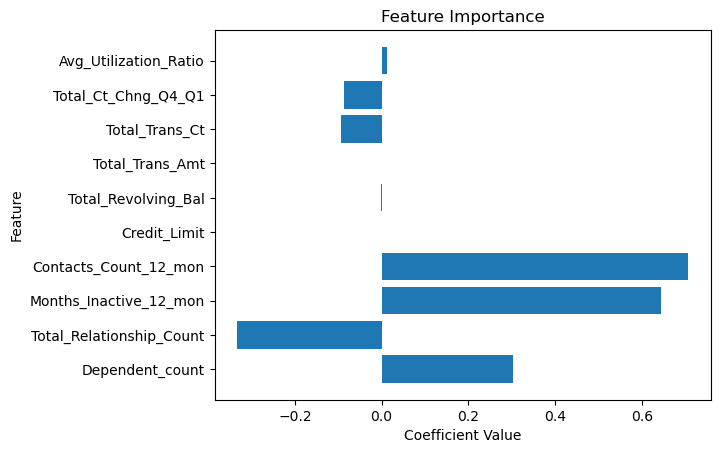

In [83]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt



# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the logistic regression model
model = LogisticRegression()

# Fit the model on the training data
model.fit(X_train, y_train)

# Make predictions on the test data
y_pred = model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Get coefficients and feature names
coefficients = model.coef_[0]
feature_names = X.columns

# Plot feature importance
plt.barh(feature_names, coefficients)
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.show()


In [85]:
coefficients.round(2)

array([ 0.3 , -0.33,  0.64,  0.71, -0.  , -0.  ,  0.  , -0.09, -0.09,
        0.01])

In [86]:
feature_names

Index(['Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1',
       'Avg_Utilization_Ratio'],
      dtype='object')

In [87]:
# Calculate absolute coefficients for feature importance
abs_coefficients = np.abs(coefficients)

# Normalize coefficients to sum up to 1 for easier comparison
normalized_coefficients = abs_coefficients / np.sum(abs_coefficients)

# Create a dictionary to store feature importance
feature_importance = dict(zip(feature_names, normalized_coefficients))

# Print feature importance
for feature, importance in feature_importance.items():
    print(f'{feature}: {importance:.4f}')

Dependent_count: 0.1385
Total_Relationship_Count: 0.1530
Months_Inactive_12_mon: 0.2954
Contacts_Count_12_mon: 0.3241
Credit_Limit: 0.0000
Total_Revolving_Bal: 0.0004
Total_Trans_Amt: 0.0002
Total_Trans_Ct: 0.0434
Total_Ct_Chng_Q4_Q1: 0.0393
Avg_Utilization_Ratio: 0.0057


In [114]:
scores=pd.DataFrame(columns=["Algorithm","Basic","Undersampling","Oversampling","Hybrid"])
scores["Algorithm"]=["Naive Bayes","Logistic Regression","Decision Tree","Random Forest"]

In [115]:
scores

,Algorithm,Basic,Undersampling,Oversampling,Hybrid
0,Naive Bayes,NaN,NaN,NaN,NaN
1,Logistic Regression,NaN,NaN,NaN,NaN
2,Decision Tree,NaN,NaN,NaN,NaN
3,Random Forest,NaN,NaN,NaN,NaN
